# Explore here

It's recommended to use this notebook for exploration purposes.

For example: 

1. You could import the CSV generated by python into your notebook and explore it.
2. You could connect to your database using `pandas.read_sql` from this notebook and explore it.

In [19]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from dotenv import load_dotenv
from sqlalchemy import create_engine
import os
from matplotlib import style

# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')


In [20]:
#load the .env file variables
load_dotenv()
connection_string = os.getenv('DATABASE_URL')
#print(connection_string)


In [21]:
df_raw = pd.read_csv(connection_string, sep =';')

In [22]:
# Paso 2 Chequear las categorias y verificar si la data esta balanceada o desbalanceada

df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [23]:
df_raw.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
4923,38,admin.,married,high.school,no,no,no,telephone,may,wed,...,4,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,no
34228,32,blue-collar,married,basic.6y,unknown,no,no,telephone,may,wed,...,3,999,1,failure,-1.8,92.893,-46.2,1.281,5099.1,no
31728,47,services,married,high.school,no,no,no,cellular,may,thu,...,1,999,0,nonexistent,-1.8,92.893,-46.2,1.327,5099.1,no
10075,40,admin.,married,high.school,no,no,no,telephone,jun,thu,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.958,5228.1,no
24444,32,admin.,single,high.school,no,yes,no,cellular,nov,mon,...,1,999,1,failure,-0.1,93.200,-42.0,4.191,5195.8,no


In [24]:
df_raw.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [25]:
# Paso 3 Cambio el tipo de variable segun si es atributo o no
# Crear una función que funcione en todas esas categorías es una buena práctica
for items in ['marital','education','default', 'housing', 'loan', 'contact', 'month','day_of_week', 'job']:
    df_raw[items] = pd.Categorical(df_raw[items])

In [26]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             41188 non-null  int64   
 1   job             41188 non-null  category
 2   marital         41188 non-null  category
 3   education       41188 non-null  category
 4   default         41188 non-null  category
 5   housing         41188 non-null  category
 6   loan            41188 non-null  category
 7   contact         41188 non-null  category
 8   month           41188 non-null  category
 9   day_of_week     41188 non-null  category
 10  duration        41188 non-null  int64   
 11  campaign        41188 non-null  int64   
 12  pdays           41188 non-null  int64   
 13  previous        41188 non-null  int64   
 14  poutcome        41188 non-null  object  
 15  emp.var.rate    41188 non-null  float64 
 16  cons.price.idx  41188 non-null  float64 
 17  cons.conf.id

In [27]:
df_raw['y'].value_counts() # desbalanceada

no     36548
yes     4640
Name: y, dtype: int64

In [28]:
fig = px.bar(df_raw, df_raw['y'], color='y')
fig.show()

In [29]:
# Analizo las variables categoricas

from funpymodeling.exploratory import freq_tbl

In [30]:
# se puede observar las frecuencias de todas las variables categoricas y sus etiquetas
freq_tbl(df_raw)

              job  frequency  percentage  cumulative_perc
0          admin.      10422    0.253035         0.253035
1     blue-collar       9254    0.224677         0.477712
2      technician       6743    0.163713         0.641425
3        services       3969    0.096363         0.737788
4      management       2924    0.070992         0.808779
5         retired       1720    0.041760         0.850539
6    entrepreneur       1456    0.035350         0.885889
7   self-employed       1421    0.034500         0.920389
8       housemaid       1060    0.025736         0.946125
9      unemployed       1014    0.024619         0.970744
10        student        875    0.021244         0.991988
11        unknown        330    0.008012         1.000000

----------------------------------------------------------------

    marital  frequency  percentage  cumulative_perc
0   married      24928    0.605225         0.605225
1    single      11568    0.280859         0.886083
2  divorced       4612 

In [31]:
# estudio la frecuencia de la variable dependiente
freq_tbl(df_raw['y'])

,y,frequency,percentage,cumulative_perc
0,no,36548,0.887346,0.887346
1,yes,4640,0.112654,1.000000


In [32]:
df_raw['housing'].value_counts() 

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64

In [33]:
df_raw['loan'].value_counts() 

no         33950
yes         6248
unknown      990
Name: loan, dtype: int64

In [34]:
df_raw['education'].value_counts()

university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: education, dtype: int64

In [35]:
df_raw['contact'].value_counts()

cellular     26144
telephone    15044
Name: contact, dtype: int64

In [36]:
df_raw['campaign'].value_counts()

1     17642
2     10570
3      5341
4      2651
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
16       51
15       51
18       33
20       30
19       26
21       24
22       17
23       16
24       15
27       11
29       10
28        8
26        8
25        8
31        7
30        7
35        5
32        4
33        4
34        3
42        2
40        2
43        2
56        1
39        1
41        1
37        1
Name: campaign, dtype: int64

In [37]:
# me gustaria ver de los trabajos cuales agrupan el 20% de la data

job_frecuencia = freq_tbl(df_raw['job'])
job_frecuencia

,job,frequency,percentage,cumulative_perc
0,admin.,10422,0.253035,0.253035
1,blue-collar,9254,0.224677,0.477712
2,technician,6743,0.163713,0.641425
3,services,3969,0.096363,0.737788
4,management,2924,0.070992,0.808779
5,retired,1720,0.041760,0.850539
6,entrepreneur,1456,0.035350,0.885889
7,self-employed,1421,0.034500,0.920389
8,housemaid,1060,0.025736,0.946125
9,unemployed,1014,0.024619,0.970744


In [38]:
job_frecuencia[job_frecuencia['percentage']>0.2]

,job,frequency,percentage,cumulative_perc
0,admin.,10422,0.253035,0.253035
1,blue-collar,9254,0.224677,0.477712


In [39]:
df_raw.groupby(['y','job'])['y'].size()

y    job          
no   admin.           9070
     blue-collar      8616
     entrepreneur     1332
     housemaid         954
     management       2596
     retired          1286
     self-employed    1272
     services         3646
     student           600
     technician       6013
     unemployed        870
     unknown           293
yes  admin.           1352
     blue-collar       638
     entrepreneur      124
     housemaid         106
     management        328
     retired           434
     self-employed     149
     services          323
     student           275
     technician        730
     unemployed        144
     unknown            37
Name: y, dtype: int64

In [40]:
fig = px.bar(df_raw, df_raw['job'], color='job')
fig.show()

In [41]:

# To approach this problem we will create a classification algorithm that helps predict 
# if a client will subscribe or not a term deposit, 
# crearemos un algoritmo de clasificación que ayude a predecir si un cliente suscribirá o no un depósito a plazo
# Solo se ha proporcionado un conjunto de datos etiquetado porque queremos que practique sus habilidades de modelado. 
# No es necesario que haga predicciones ya que no se ha proporcionado ningún conjunto de prueba, sin embargo, asegúrese de dividir sus datos en conjuntos de entrenamiento y validación para evaluar el rendimiento de su modelo, 
# ya que el banco solicitaría un modelo confiable para usarlo.
# En esta ocasión queremos que te centres en la parte de modelado y optimización, por lo que te daremos algunas pistas para el proceso de limpieza.


In [42]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             41188 non-null  int64   
 1   job             41188 non-null  category
 2   marital         41188 non-null  category
 3   education       41188 non-null  category
 4   default         41188 non-null  category
 5   housing         41188 non-null  category
 6   loan            41188 non-null  category
 7   contact         41188 non-null  category
 8   month           41188 non-null  category
 9   day_of_week     41188 non-null  category
 10  duration        41188 non-null  int64   
 11  campaign        41188 non-null  int64   
 12  pdays           41188 non-null  int64   
 13  previous        41188 non-null  int64   
 14  poutcome        41188 non-null  object  
 15  emp.var.rate    41188 non-null  float64 
 16  cons.price.idx  41188 non-null  float64 
 17  cons.conf.id

In [43]:
# me gustaria ver como se distribuye la duracion de la llamada en minutos donde cada 60 es un minuto
df_raw['duration'].describe()


count    41188.000000
mean       258.285010
std        259.279249
min          0.000000
25%        102.000000
50%        180.000000
75%        319.000000
max       4918.000000
Name: duration, dtype: float64

In [44]:
# diccionario de Datos

#Significado de cada atributo:

#Edad (numérica)
#Trabajo: Tipo de trabajo (categórico)
#Civil: estado civil (categórico)
#Educación: (categórico)
#Mora: ¿tiene crédito en mora? (categórico)
#Vivienda: tiene préstamo de vivienda? (categórico)
#Préstamo: tiene préstamo personal? (categórico)
#contacto: tipo de comunicación de contacto (categorial)
#mes: último contacto mes del año (categórico)
#day_of_week: último día de contacto de la semana (categórico)
#duración: duración del último contacto, en segundos (numérico)
#Nota importante: esta salida afecta en gran medida al objetivo de salida 
#(si la duración = 0, entonces y = 'no'). Sin embargo, la duración no se conoce antes de que se realice una llamada. 
#Además, después del final de la llamada, obviamente se conoce y. Considere si debe incluirlo o no para un modelo predictivo realista.

#campaña: número de contactos realizados durante esta campaña y para este cliente (numérico)
#pdays: número de días que pasaron después de que el cliente fue contactado por última vez de una campaña anterior (numérico; 999 significa que el cliente no fue contactado previamente)
#anterior: número de contactos realizados antes de esta campaña y para este cliente (numérico)
#poutcome: resultado de la campaña de marketing anterior (categórico)
#Nota importante: este atributo tiene tres categorías: 'fracaso', 'éxito' e 'inexistente'. El 86% de los datos cae en la categoría 'inexistente'.

#emp.var.rate: tasa de variación del empleo - indicador trimestral (numérico)
#cons.price.idx: índice de precios al consumidor- indicador mensual (numérico)
#cons.conf.idx: índice de confianza del consumidor - indicador mensual (numérico)
#euribor3m: tasa euribor 3 meses: - indicador diario (numérico)
#nr.employed: número de empleados - indicador trimestral (numérico)
#Variable objetivo:

#y: ¿el cliente ha suscrito un depósito a plazo?


In [45]:
df_r = df_raw.copy()

In [46]:
#Sugerencia para el proceso de limpieza:

#El conjunto de datos no tiene valores nulos, pero asegúrese de eliminar las filas duplicadas
df_r = df_r.drop_duplicates()

In [47]:
df_r.corr()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,-0.000808,0.004622,-0.034381,0.024379,-0.000242,0.001009,0.129075,0.010852,-0.017607
duration,-0.000808,1.000000,-0.071765,-0.047556,0.020600,-0.027941,0.005303,-0.008126,-0.032861,-0.044672
campaign,0.004622,-0.071765,1.000000,0.052606,-0.079182,0.150786,0.127826,-0.013657,0.135169,0.144129
pdays,-0.034381,-0.047556,0.052606,1.000000,-0.587508,0.271063,0.078920,-0.091374,0.296946,0.372659
previous,0.024379,0.020600,-0.079182,-0.587508,1.000000,-0.420587,-0.203197,-0.050929,-0.454571,-0.501411
emp.var.rate,-0.000242,-0.027941,0.150786,0.271063,-0.420587,1.000000,0.775293,0.196257,0.972244,0.906949
cons.price.idx,0.001009,0.005303,0.127826,0.078920,-0.203197,0.775293,1.000000,0.059170,0.688180,0.521945
cons.conf.idx,0.129075,-0.008126,-0.013657,-0.091374,-0.050929,0.196257,0.059170,1.000000,0.277864,0.100679
euribor3m,0.010852,-0.032861,0.135169,0.296946,-0.454571,0.972244,0.688180,0.277864,1.000000,0.945146
nr.employed,-0.017607,-0.044672,0.144129,0.372659,-0.501411,0.906949,0.521945,0.100679,0.945146,1.000000


In [48]:
df_r.shape

(41176, 21)

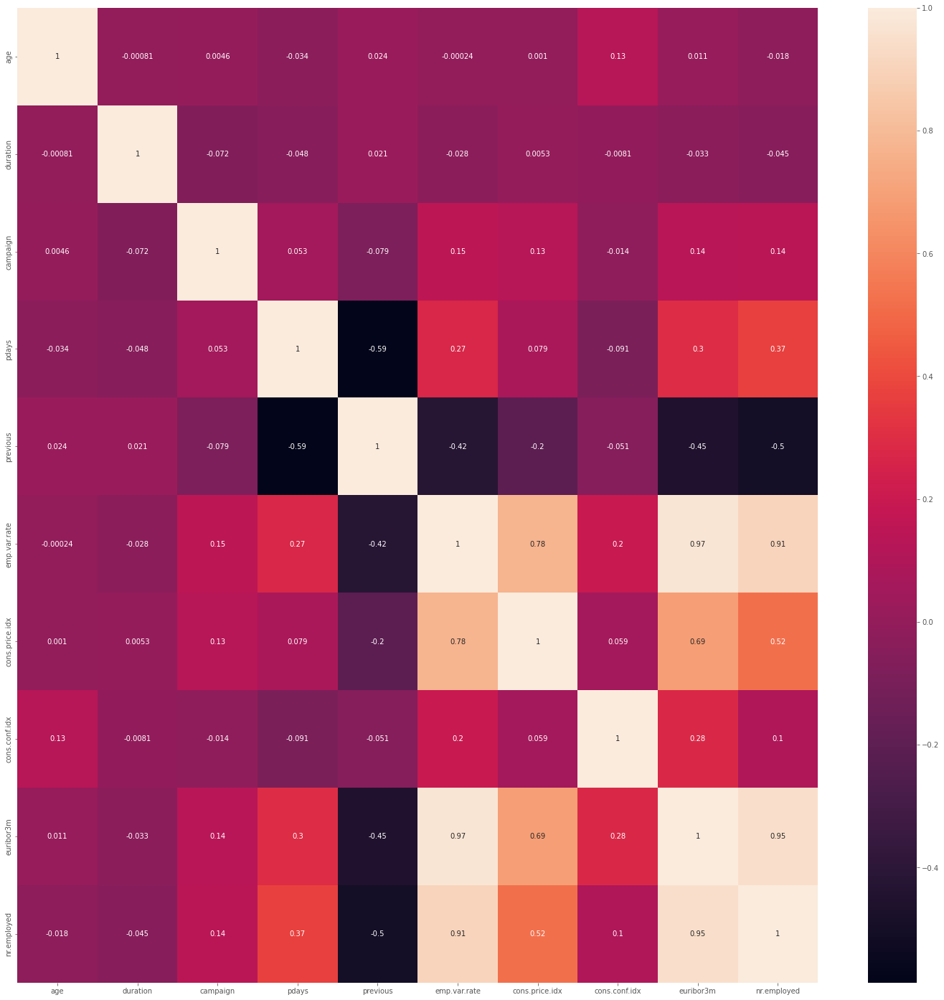

In [49]:
# hacemos una matriz de correlacion de todas las variables independientes
plt.figure(figsize=(25,25))
corr_matriz = df_r.corr()
heat_map = sns.heatmap(corr_matriz, annot=True)
plt.show()

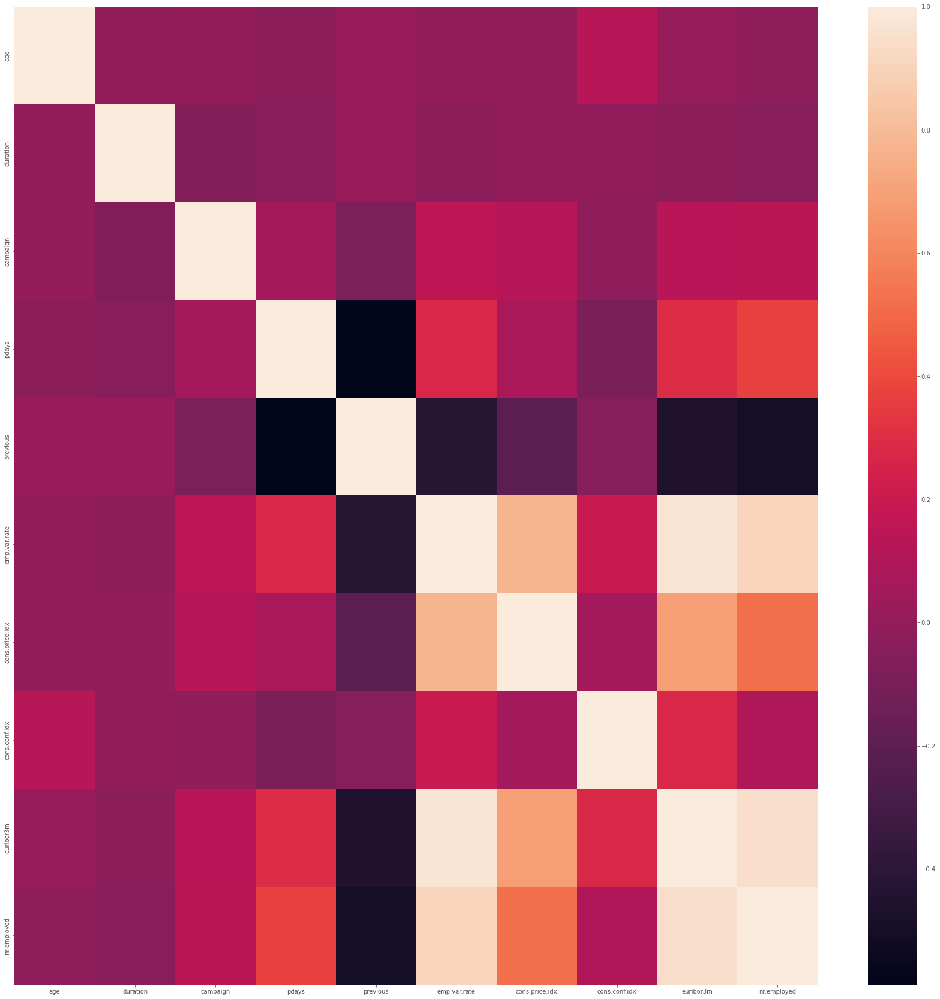

In [50]:
# hacemos una matriz de correlacion de todas las variables independientes
plt.figure(figsize=(30,30))
corr_matriz = df_r.corr()
heat_map = sns.heatmap(corr_matriz, annot=False)
plt.show()

In [51]:
# elegimos que variables usaremos para la regresion, necesitamos limpiar

In [52]:
df_r.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41176 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             41176 non-null  int64   
 1   job             41176 non-null  category
 2   marital         41176 non-null  category
 3   education       41176 non-null  category
 4   default         41176 non-null  category
 5   housing         41176 non-null  category
 6   loan            41176 non-null  category
 7   contact         41176 non-null  category
 8   month           41176 non-null  category
 9   day_of_week     41176 non-null  category
 10  duration        41176 non-null  int64   
 11  campaign        41176 non-null  int64   
 12  pdays           41176 non-null  int64   
 13  previous        41176 non-null  int64   
 14  poutcome        41176 non-null  object  
 15  emp.var.rate    41176 non-null  float64 
 16  cons.price.idx  41176 non-null  float64 
 17  cons.conf.id

In [53]:
# se va a predecir el deposito a plazo fijo
# 'y' esta es la variable objetivo como se entiende que la variable de confianzza 
# puede estar correlacionada de forma positiva con la variable objetivo, ya que
# para que un cliente decida ahorrar en un depósito a plazo necesita confianza, usaremos la
# variable confianza como guia
df_r_3 = pd.DataFrame(df_r.corrwith(df_r['cons.conf.idx'], axis=0), columns=['correlacion'])
df_r_3

,correlacion
age,0.129075
duration,-0.008126
campaign,-0.013657
pdays,-0.091374
previous,-0.050929
emp.var.rate,0.196257
cons.price.idx,0.059170
cons.conf.idx,1.000000
euribor3m,0.277864
nr.employed,0.100679


In [54]:
# estas son las variables que sacaremos del modelo por su alta correlacion
df_r_3[abs(df_r_3['correlacion'])> 0.30]

,correlacion
cons.conf.idx,1.0


In [55]:
df_r_3[abs(df_r_3['correlacion'])> 0.30].index

Index(['cons.conf.idx'], dtype='object')

In [56]:
def plot_boxplot(df_r, items2):
    df_r.boxplot(column = [items2])
    plt.grid(False)
    plt.show()

In [57]:
# remuevo los outliers, defino la funcion llamada "outliers"
# IQR = Q3 - Q1

def outliers(df_r, items2):
    Q1 = df_r[items2].quantile(0.25)
    Q3 = df_r[items2].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    ls = df_r.index[(df_r[items2] < lower_bound) | (df_r[items2] > upper_bound) ]

    return ls


In [58]:
# creo la lista de indices

index_list = []

for feature in ['age','campaign','duration','emp.var.rate','cons.price.idx']:
    index_list.extend(outliers(df_r, feature))

In [59]:
index_list

[27713,
 27757,
 27780,
 27800,
 27802,
 27805,
 27808,
 27810,
 27811,
 27812,
 27813,
 27814,
 27815,
 27816,
 27817,
 27818,
 27826,
 27837,
 27838,
 27844,
 27851,
 27875,
 27879,
 27902,
 27930,
 27950,
 27951,
 27963,
 28220,
 28221,
 28312,
 28456,
 28504,
 28530,
 28540,
 28586,
 28619,
 28732,
 28773,
 29225,
 29263,
 29498,
 29625,
 29668,
 29682,
 29973,
 29977,
 29981,
 29987,
 29990,
 30000,
 30004,
 30006,
 30072,
 30078,
 30079,
 30088,
 30103,
 30110,
 30133,
 30171,
 30214,
 30225,
 30227,
 30241,
 30334,
 30335,
 30390,
 30430,
 30460,
 30589,
 35833,
 35848,
 35856,
 35878,
 35973,
 36183,
 36285,
 36311,
 36383,
 36384,
 36816,
 36998,
 37136,
 37137,
 37170,
 37186,
 37190,
 37192,
 37193,
 37195,
 37206,
 37207,
 37213,
 37219,
 37227,
 37235,
 37237,
 37239,
 37257,
 37260,
 37316,
 37341,
 37355,
 37371,
 37403,
 37454,
 37455,
 37472,
 37479,
 37493,
 37505,
 37509,
 37512,
 37525,
 37532,
 37545,
 37568,
 37570,
 37586,
 37597,
 37601,
 37602,
 37604,
 37635,


In [60]:
# defino la funcion para remover los valores

def remove(df_r, ls):
    ls = sorted(set(ls))
    df = df_r.drop(ls)
    return df

In [61]:
df_cleaned = remove(df_r, index_list)

In [62]:
df_cleaned

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41181,37,admin.,married,university.degree,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41182,29,unemployed,single,basic.4y,no,yes,no,cellular,nov,fri,...,1,9,1,success,-1.1,94.767,-50.8,1.028,4963.6,no
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no


In [63]:
df_cleaned.shape


(35524, 21)

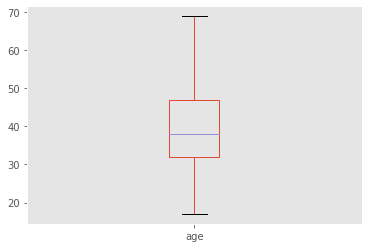

In [64]:
plot_boxplot(df_cleaned,'age')

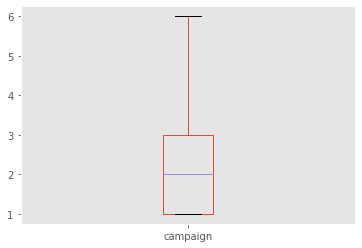

In [65]:
plot_boxplot(df_cleaned, 'campaign')

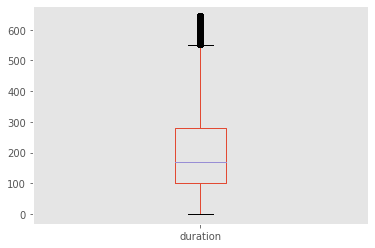

In [66]:
plot_boxplot(df_cleaned,'duration')

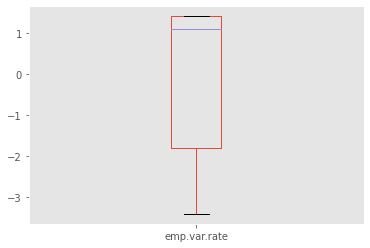

In [67]:
plot_boxplot(df_cleaned, 'emp.var.rate')

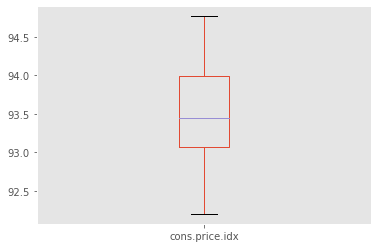

In [68]:
plot_boxplot(df_cleaned, 'cons.price.idx')

In [69]:
freq_tbl(df_cleaned['marital']) # datos desconocidos no relevantes

,marital,frequency,percentage,cumulative_perc
0,married,21484,0.604774,0.604774
1,single,10074,0.283583,0.888357
2,divorced,3904,0.109898,0.998255
3,unknown,62,0.001745,1.000000


In [70]:
freq_tbl(df_cleaned['education']) # aca representan el 4% de la data

,education,frequency,percentage,cumulative_perc
0,university.degree,10548,0.296926,0.296926
1,high.school,8278,0.233026,0.529952
2,basic.9y,5293,0.148998,0.678949
3,professional.course,4548,0.128026,0.806976
4,basic.4y,3412,0.096048,0.903023
5,basic.6y,1973,0.055540,0.958563
6,unknown,1458,0.041043,0.999606
7,illiterate,14,0.000394,1.000000


In [71]:
freq_tbl(df_cleaned['default']) # aca los datos desconocidos representan el 22% de los datos, ademas de un desbalance

,default,frequency,percentage,cumulative_perc
0,no,28151,0.792450,0.792450
1,unknown,7370,0.207465,0.999916
2,yes,3,0.000084,1.000000


In [72]:
freq_tbl(df_cleaned['housing']) # no representan mas del 2%

,housing,frequency,percentage,cumulative_perc
0,yes,18653,0.525082,0.525082
1,no,16014,0.450794,0.975875
2,unknown,857,0.024125,1.000000


In [73]:
freq_tbl(df_cleaned['loan']) # 2% 

,loan,frequency,percentage,cumulative_perc
0,no,29285,0.824372,0.824372
1,yes,5382,0.151503,0.975875
2,unknown,857,0.024125,1.000000


In [74]:
freq_tbl(df_cleaned['contact'])

,contact,frequency,percentage,cumulative_perc
0,cellular,22599,0.636161,0.636161
1,telephone,12925,0.363839,1.000000


In [75]:
freq_tbl(df_cleaned['month'])

,month,frequency,percentage,cumulative_perc
0,may,12157,0.342219,0.342219
1,jul,5876,0.165409,0.507629
2,aug,5315,0.149617,0.657246
3,jun,4507,0.126872,0.784118
4,nov,3706,0.104324,0.888442
5,apr,2305,0.064886,0.953327
6,oct,594,0.016721,0.970048
7,mar,467,0.013146,0.983194
8,sep,459,0.012921,0.996115
9,dec,138,0.003885,1.000000


In [76]:
freq_tbl(df_cleaned['day_of_week'])

,day_of_week,frequency,percentage,cumulative_perc
0,mon,7492,0.210900,0.210900
1,thu,7308,0.205720,0.416620
2,tue,7049,0.198429,0.615049
3,wed,6998,0.196994,0.812043
4,fri,6677,0.187957,1.000000


In [77]:
df_cleaned['age'].value_counts()

31    1704
33    1598
32    1597
35    1551
36    1547
34    1540
30    1470
37    1284
29    1265
39    1258
38    1242
41    1121
40    1025
42    1006
45     947
46     903
43     897
28     892
44     885
48     848
47     808
27     748
50     745
49     740
52     675
51     674
53     628
56     611
26     610
54     598
55     564
57     554
58     508
25     505
59     393
24     392
60     249
23     194
22     120
21      91
61      69
20      59
62      59
63      54
64      51
66      47
65      41
19      40
69      31
68      30
18      28
67      24
17       4
Name: age, dtype: int64

<AxesSubplot:xlabel='y', ylabel='count'>

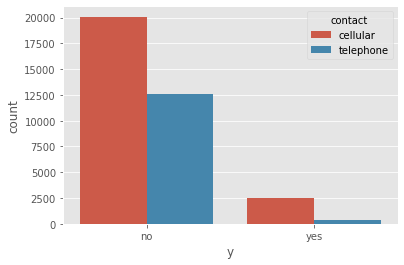

In [78]:
sns.countplot(x='y', hue='contact', data=df_cleaned)

In [79]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35524 entries, 0 to 41186
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             35524 non-null  int64   
 1   job             35524 non-null  category
 2   marital         35524 non-null  category
 3   education       35524 non-null  category
 4   default         35524 non-null  category
 5   housing         35524 non-null  category
 6   loan            35524 non-null  category
 7   contact         35524 non-null  category
 8   month           35524 non-null  category
 9   day_of_week     35524 non-null  category
 10  duration        35524 non-null  int64   
 11  campaign        35524 non-null  int64   
 12  pdays           35524 non-null  int64   
 13  previous        35524 non-null  int64   
 14  poutcome        35524 non-null  object  
 15  emp.var.rate    35524 non-null  float64 
 16  cons.price.idx  35524 non-null  float64 
 17  cons.conf.id

In [80]:
df_cleaned['y'] = df_cleaned['y'].apply(lambda x:1 if x=='no' else 0)

In [81]:
df = pd.get_dummies(df_cleaned, drop_first = True) # pasa todas las variables categoricas y las pasa a dummies

In [82]:
df.sample(5)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
21964,59,77,1,999,0,1.4,93.444,-36.1,4.964,5228.1,...,0,0,0,0,0,0,0,1,1,0
34756,29,42,3,999,0,-1.8,92.893,-46.2,1.266,5099.1,...,1,0,0,0,0,1,0,0,1,0
26490,38,82,1,999,0,-0.1,93.200,-42.0,4.076,5195.8,...,0,1,0,0,0,1,0,0,1,0
8360,30,482,2,999,0,1.4,94.465,-41.8,4.864,5228.1,...,0,0,0,0,0,0,1,0,1,0
25030,54,432,2,999,0,-0.1,93.200,-42.0,4.153,5195.8,...,0,1,0,0,0,0,1,0,1,0


In [83]:
#df.describe(include='O') # me dice cuantas variables categoricas me estan quedando en el dataset

In [84]:
df = pd.get_dummies(df, drop_first = True) # pasa todas las variables categoricas y las pasa a dummies

In [85]:
df.sample(5)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
7032,48,413,1,999,0,1.1,93.994,-36.4,4.860,5191.0,...,1,0,0,0,0,1,0,0,1,0
40781,33,208,2,999,0,-1.1,94.199,-37.5,0.879,4963.6,...,0,0,0,1,0,0,0,1,1,0
2700,29,231,1,999,0,1.1,93.994,-36.4,4.859,5191.0,...,1,0,0,0,0,0,0,1,1,0
25479,40,210,1,999,0,-0.1,93.200,-42.0,4.120,5195.8,...,0,1,0,0,0,0,0,1,1,0
2961,31,142,3,999,0,1.1,93.994,-36.4,4.859,5191.0,...,1,0,0,0,0,0,0,1,1,0


In [86]:
df['y'].value_counts()

1    32651
0     2873
Name: y, dtype: int64

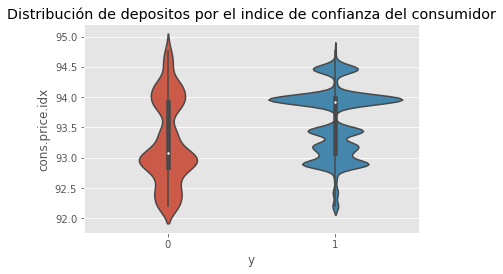

In [107]:
# Gráfico
# ==============================================================================
fig, ax = plt.subplots(figsize=(6, 3.84))

sns.violinplot(
        x     = 'y',
        y     = 'cons.price.idx',
        data  = df,
        #color = "white",
        ax    = ax
    )

ax.set_title('Distribución de depositos por el indice de confianza del consumidor');

In [87]:
# Convierta la edad en datos categóricos creando grupos de edad de diez años
# Use .cut en pandas y use los siguientes contenedores: [10,20,30,40,50,60,70,80,90,98]
#df_cleaned['age'] = pd.Categorical(df_cleaned['age'])
#X['bins_age'] = pd.cut(x=X['age'], bins=[10,20,30,40,50,60,70,80,90,100], labels = ['17-20','21-30','31-40','41-50','51-60','61-70','71-80','81-90','91-100'])
#X.sample(10)


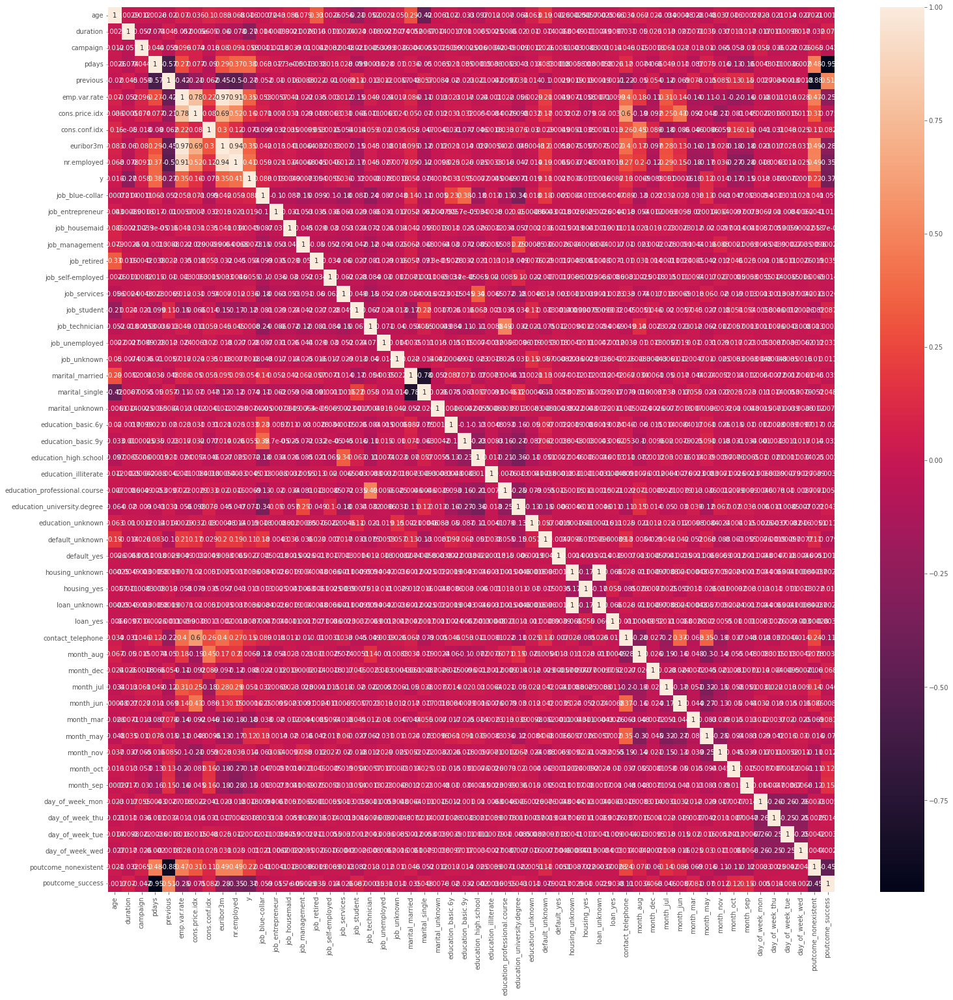

In [88]:
plt.figure(figsize=(25,25))
corr_matriz = df.corr()
heat_map = sns.heatmap(corr_matriz, annot=True)
plt.show()

In [89]:
df = pd.get_dummies(df, drop_first = True) # pasa todas las variables categoricas y las pasa a dummies

In [90]:
df.sample(5)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
19902,44,629,2,999,0,1.4,93.444,-36.1,4.966,5228.1,...,0,0,0,0,0,0,0,0,1,0
31177,26,209,1,999,0,-1.8,92.893,-46.2,1.334,5099.1,...,1,0,0,0,0,0,0,1,1,0
29717,38,93,3,999,0,-1.8,93.075,-47.1,1.405,5099.1,...,0,0,0,0,1,0,0,0,1,0
1796,46,133,1,999,0,1.1,93.994,-36.4,4.855,5191.0,...,1,0,0,0,0,0,0,0,1,0
18592,31,166,3,999,0,1.4,93.918,-42.7,4.968,5228.1,...,0,0,0,0,0,1,0,0,1,0


In [91]:
# Step 4:


#Time to build your model!

#Separate your target variable from the predictors
#Choose how to divide your data to evaluate the performance of your model

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV

In [92]:
df.shape

(35524, 54)

In [93]:
X = df.drop(['y','cons.conf.idx'], axis=1)
y = df['y']

In [94]:
X.sample(5)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,euribor3m,nr.employed,job_blue-collar,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
36614,35,269,1,999,0,-2.9,92.963,1.260,5076.2,0,...,0,0,0,0,0,1,0,0,1,0
28205,41,226,2,999,0,-1.8,93.075,1.453,5099.1,0,...,0,0,0,0,0,0,1,0,1,0
41002,45,316,2,999,2,-1.1,94.601,1.016,4963.6,0,...,0,0,1,0,0,0,0,1,0,0
2822,41,139,1,999,0,1.1,93.994,4.859,5191.0,0,...,1,0,0,0,0,0,0,1,1,0
35462,35,59,2,999,0,-1.8,92.893,1.244,5099.1,0,...,1,0,0,0,1,0,0,0,1,0


In [95]:
# separo el dataset de entranamiento
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=53, test_size=0.15)

In [96]:
X_train.shape

(30195, 52)

In [118]:
# corro el primer modelo
# Para no incluir ningún tipo de regularización en el modelo se indica
# penalty='none'
model = LogisticRegression(solver='lbfgs', max_iter= 10000, penalty='none')


In [119]:
model.fit(X_train, y_train)

LogisticRegression(max_iter=10000, penalty='none')

In [120]:
accuracyTrain = model.score(X_train,y_train)
accuracyTest = model.score(X_test,y_test)

print('Accuracy in Training set: ', accuracyTrain)
print('Accuracy in Testing set: ', accuracyTest)

Accuracy in Training set:  0.9350223546944858
Accuracy in Testing set:  0.9384499906173767


In [121]:
prediccion = model.predict(X_test)

In [126]:
from sklearn.model_selection import  cross_val_score

In [127]:
scores = cross_val_score(model, X_train, y_train, cv=5).mean()
print('Accuracy in cross validation: ', scores)

Accuracy in cross validation:  0.9341944030468621


In [128]:
model.coef_

array([[ 4.58947904e-03, -7.70441812e-03,  5.79243128e-02,
         1.74735331e-03,  9.69714448e-02,  6.93896600e-01,
        -4.37550566e-01, -1.09486497e-01,  8.63129434e-03,
         3.35429061e-01,  6.35958261e-02, -5.33987235e-03,
         7.46314769e-02, -1.76761705e-01,  1.29064140e-02,
         2.20289965e-01, -2.39328901e-01,  1.55959062e-02,
        -5.85663792e-02, -7.62653415e-05, -5.46990883e-02,
        -3.94922471e-02, -2.32741249e-02,  7.89367938e-02,
         2.08008024e-01,  8.63159803e-02, -1.33903543e-02,
        -1.27895260e-01, -1.53255538e-01, -1.09932739e-01,
         4.09639098e-01,  3.49263549e-05,  2.04959072e-02,
         3.40088275e-02,  2.04959072e-02,  1.01415740e-01,
         1.94294249e-01, -4.18197490e-01, -4.02124672e-02,
        -2.07199816e-01, -3.86262811e-02, -7.87449291e-01,
         1.22397788e+00,  2.27033336e-01, -1.64654391e-01,
        -2.45717760e-03,  2.31119649e-01, -3.50802670e-02,
        -1.05003504e-01, -2.11491379e-01, -2.78611569e-0

In [130]:
prediccion = model.predict(X = X_test)
prediccion

array([1, 1, 1, ..., 1, 1, 1])

In [137]:
# Confusion Matrix

confusion_matrix(prediccion, y_test)

array([[ 163,   76],
       [ 252, 4838]])

In [ ]:
#Conclusion

#El modelo logístico creado para predecir la probabilidad de que un 
#Deposito a plazo fijo . 
#El porcentaje de clasificación correcta en el conjunto del test es del 93.8%